In [9]:
import numpy as np
from plotly3d.plot import scatter, trajectories
import plotly.graph_objects as go

In [2]:
cfg_main_data_name = 'ellipsoid_none_0'
results_path = f'../geodesic_comparision/res_pkl/{cfg_main_data_name}/'
data_pred = np.load(f'{results_path}/ours.npz')
data_no = np.load(f'{results_path}/no_density.npz')
data_gt = np.load(f'../../data/neurips_results/toy/gt/{cfg_main_data_name}.npz')

In [3]:
data_pred.files

['x0', 'x1', 'xhat']

In [4]:
data_gt.files

['X',
 'X_ground_truth',
 'start_points',
 'end_points',
 'geodesics',
 'geodesic_lengths']

In [5]:
fig = scatter(data_gt['X'], s=3, alpha=.2)
fig = scatter(data_pred['x0'], s=10, fig=fig)
fig = scatter(data_pred['x1'], s=10, fig=fig)
fig = trajectories(np.transpose(data_gt['geodesics'], (1,0,2)), s=5, fig=fig, title='', white_bkgrnd=True, ticks=False)
fig.show()

In [58]:
# fig = scatter(data_pred['x0'], s=10, fig=fig)
# fig = scatter(data_pred['x1'], s=10, fig=fig)
x0 = data_pred['x0']
x1 = data_pred['x1']
x = data_gt['X']
fig = go.Figure()
fig.add_trace(
    go.Scatter3d(
            x=x[:,0],
            y=x[:,1],
            z=x[:,2],
            mode='markers',
            marker=dict(size=3, opacity=1, color='blue',),  # Use integer mapping for color
            name='background'  # Use actual category name for legend
    )
)
# fig = trajectories(data_pred['xhat'], s=5, fig=fig, title='Density', white_bkgrnd=True, )
# for trace in fig.data:
#     if 'line' in trace.mode:
#         trace.update(line=dict(color='black'))
fig.add_trace(
    go.Scatter3d(
            x=x0[:,0],
            y=x0[:,1],
            z=x0[:,2],
            mode='markers',
            marker=dict(size=10, opacity=1, color='green', line=dict(color='black', width=1)), # Use integer mapping for color
            name='start'  # Use actual category name for legend
    )
)
# fig.add_trace(
#     go.Scatter3d(
#             x=x1[:,0],
#             y=x1[:,1],
#             z=x1[:,2],
#             mode='markers',
#             marker=dict(size=10, opacity=1, color='red', line=dict(color='black', width=1)), # Use integer mapping for color
#             name='end'  # Use actual category name for legend
#     )
# )

fig.show()

In [67]:
x0 = data_pred['x0']
x1 = data_pred['x1']
x = data_gt['X']

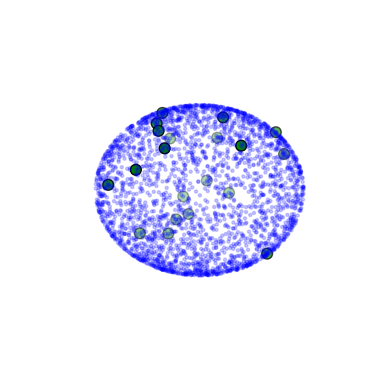

In [68]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Create figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Add background points
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c='blue', s=5, alpha=0.2,  zorder=1)

# Add start points
ax.scatter(x0[:, 0], x0[:, 1], x0[:, 2], c='green', s=60, edgecolor='black',  zorder=2)

# Add end points
# ax.scatter(x1[:, 0], x1[:, 1], x1[:, 2], c='red', s=60, edgecolor='black', zorder=3)

# Remove ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

# Remove axes
ax.set_axis_off()

# Show plot
plt.show()


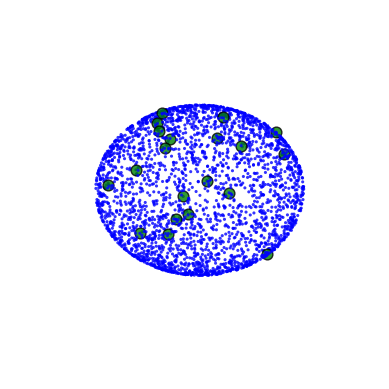

In [69]:
# Combine the data into a single array for sorting
all_points = np.vstack((x, x0))
colors = np.array(['blue'] * len(x) + ['green'] * len(x0))
sizes = np.array([5] * len(x) + [60] * len(x0))
edges = np.array(['none'] * len(x) + ['black'] * len(x0))

# Sort the points by z-coordinate
sorted_indices = np.argsort(all_points[:, 2])
all_points = all_points[sorted_indices]
colors = colors[sorted_indices]
sizes = sizes[sorted_indices]
edges = edges[sorted_indices]

# Create figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the sorted points
for point, color, size, edge in zip(all_points, colors, sizes, edges):
    ax.scatter(point[0], point[1], point[2], c=color, s=size, edgecolor=edge, alpha=0.8)

# Remove ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

# Remove axes
ax.set_axis_off()

# Show plot
plt.show()

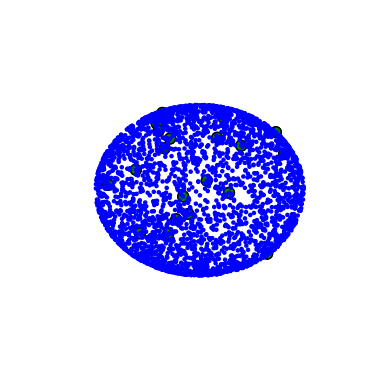

In [81]:
# Create figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the background points first
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c='blue', s=5, alpha=1)

# Plot the x0 points after, ensuring they are rendered last
ax.scatter(x0[:, 0], x0[:, 1], x0[:, 2], c='green', s=60, edgecolor='black', alpha=1)

# Remove ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

# Remove axes
ax.set_axis_off()

# Show plot
plt.show()

In [84]:
# Extract data
x0 = data_pred['x0']
x1 = data_pred['x1']
x = data_gt['X']

# Create initial figure
fig = go.Figure()

# Add background scatter plot
fig.add_trace(
    go.Scatter3d(
        x=x[:,0],
        y=x[:,1],
        z=x[:,2],
        mode='markers',
        marker=dict(size=3, opacity=0.2, color='blue'),
        name='background'
    )
)

fig = trajectories(np.transpose(data_gt['geodesics'], (1,0,2)), s=5, fig=fig)
for trace in fig.data:
    if 'line' in trace.mode:
        trace.update(line=dict(color='black'))

# Add start points
fig.add_trace(
    go.Scatter3d(
        x=x0[:,0],
        y=x0[:,1],
        z=x0[:,2],
        mode='markers',
        marker=dict(size=20, opacity=1, color='green', line=dict(color='black', width=1)),
        name='start'
    )
)

# Add end points
fig.add_trace(
    go.Scatter3d(
        x=x1[:,0],
        y=x1[:,1],
        z=x1[:,2],
        mode='markers',
        marker=dict(size=20, opacity=1, color='red', line=dict(color='black', width=1)),
        name='end'
    )
)

# Ensure proper layering by updating traces
fig.data = fig.data[::-1]

# Show the figure
fig.show()

In [39]:
for i, trace in enumerate(fig.data):
    print(f"Trace {i+1}:")
    print(f"  Type: {trace.type}")
    print(f"  Mode: {trace.mode}")
    print(f"  Name: {trace.name}")
    print(f"  Marker Color: {trace.marker.color if 'marker' in trace else 'N/A'}")
    print(f"  Line Color: {trace.line.color if 'line' in trace else 'N/A'}")
    print("")


Trace 1:
  Type: scatter3d
  Mode: markers
  Name: end
  Marker Color: red
  Line Color: None

Trace 2:
  Type: scatter3d
  Mode: markers
  Name: start
  Marker Color: green
  Line Color: None

Trace 3:
  Type: scatter3d
  Mode: markers
  Name: background
  Marker Color: blue
  Line Color: None



In [37]:
# Print the trace order
for i, trace in enumerate(fig.data):
    print(f"Trace {i+1}: {trace.name}")

Trace 1: background
Trace 2: start
Trace 3: end


In [33]:
fig = scatter(data_gt['X'], s=3, alpha=.2)
fig = scatter(data_gt['start_points'], s=10, fig=fig)
fig = scatter(data_gt['end_points'], s=10, fig=fig)
fig = trajectories(np.transpose(data_gt['geodesics'], (1,0,2)), s=5, fig=fig, title='Density', white_bkgrnd=True, )
fig.show()